In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import defaultdict


import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
import pickle

In [2]:
twitch_little_data = pd.read_csv('100k_a.csv', header = None, names = ['user_id', 'stream_id', 'streamer_username', 'time_start', 'time_stop'])
twitch_little_data.head()

,user_id,stream_id,streamer_username,time_start,time_stop
0,1,33842865744,mithrain,154,156
1,1,33846768288,alptv,166,169
2,1,33886469056,mithrain,587,588
3,1,33887624992,wtcn,589,591
4,1,33890145056,jrokezftw,591,594


In [3]:
twitch_little_data['time_start'] *= 10 
twitch_little_data['time_stop'] *= 10 

twitch_little_data['time_watched'] = (twitch_little_data['time_stop'] - twitch_little_data['time_start'])

twitch_little_data['relative_time_start'] = twitch_little_data['time_start'] % (24*60)
twitch_little_data['relative_time_stop'] = twitch_little_data['time_stop'] % (24*60)

twitch_little_data['relative_hour_start'] = twitch_little_data['relative_time_start']  // 60
twitch_little_data['relative_hour_stop'] = twitch_little_data['relative_time_stop']  // 60

twitch_little_data['day_start'] = twitch_little_data['time_start'] // (24*60)
twitch_little_data['day_stop'] = twitch_little_data['time_stop'] // (24*60)

twitch_little_data['week_start'] = twitch_little_data['day_start'] % 7 + 1
twitch_little_data['week_stop'] = twitch_little_data['day_stop'] % 7 + 1

In [4]:
# twitch_little_data.head();

## Basic Exploration

In [5]:
num_interactions = twitch_little_data.shape[0]
num_unique_users = twitch_little_data['user_id'].nunique()
num_unique_streamers = twitch_little_data['streamer_username'].nunique()

num_interactions, num_unique_users, num_unique_streamers

(1048575, 34611, 86683)

## Distribution of watch time

count    1.048575e+06
mean     3.126626e+01
std      4.218047e+01
min      1.000000e+01
25%      1.000000e+01
50%      1.000000e+01
75%      3.000000e+01
max      9.000000e+02
Name: time_watched, dtype: float64

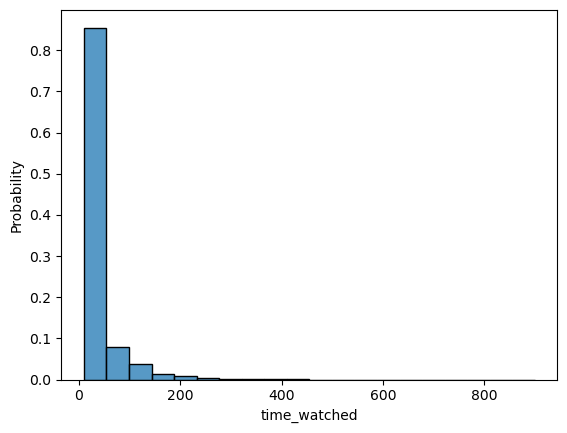

In [6]:
sns.histplot(twitch_little_data, x = 'time_watched', bins=20, stat= 'probability')
twitch_little_data['time_watched'].describe()

## Distribution of number of unique streamers watched by viewers

[None, None]

<Figure size 2000x800 with 0 Axes>

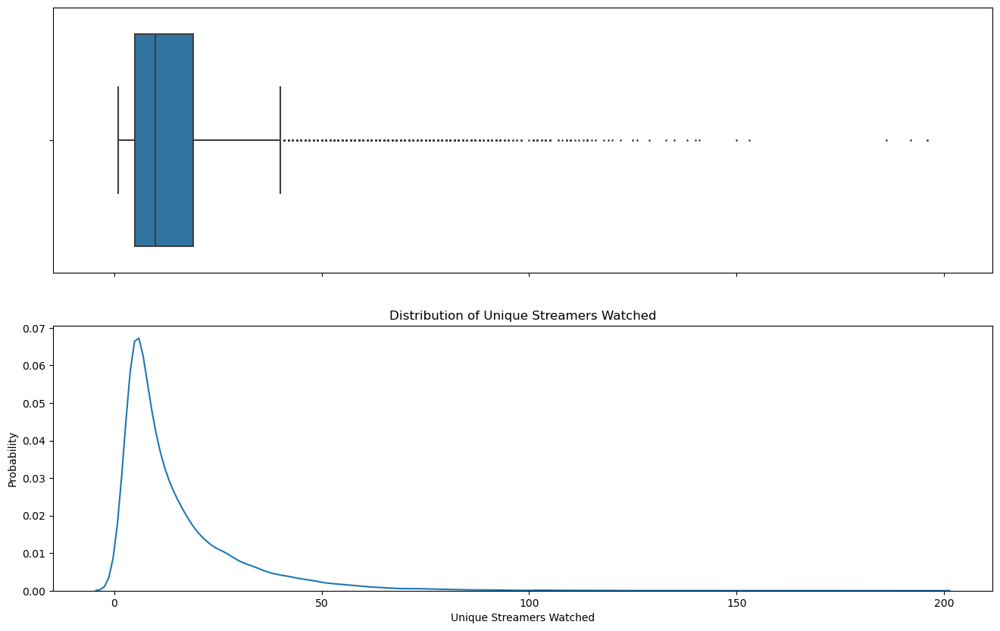

In [7]:
twitch_streamer_per_user = twitch_little_data[['user_id', 'streamer_username']].groupby('user_id').apply(lambda x : len(np.unique(x)))
plt.figure(figsize=(25, 10), dpi=80)
fig, axs = plt.subplots(nrows=2, sharex=True)
sns.boxplot(x=twitch_streamer_per_user, fliersize = 1, ax=axs[0])
fig_kde = sns.kdeplot(twitch_streamer_per_user, ax = axs[1])
fig_kde.set(xlabel='Unique Streamers Watched', ylabel='Probability', title='Distribution of Unique Streamers Watched')
fig.set(figheight=10, figwidth=16)

## Distribution of the proportion of watchtime by percentile

,percentile,time_watched
0,1,0.528916
1,2,0.102670
2,3,0.059347
3,4,0.039966
4,5,0.029506
...,...,...
95,96,0.000264
96,97,0.000264
97,98,0.000264
98,99,0.000264


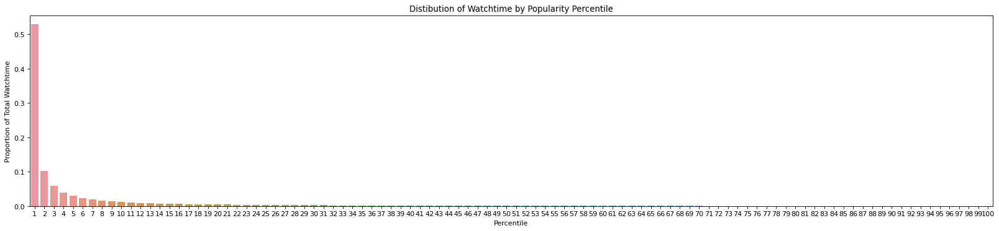

In [8]:
total_watchtime = twitch_little_data['time_watched'].sum()
streamer_watchtime = twitch_little_data[['time_watched', 'streamer_username']].groupby('streamer_username').sum().sort_values('time_watched', ascending=False)
prop_of_total_watchtime = (streamer_watchtime/total_watchtime).reset_index()

prop_of_total_watchtime['percentile'] = 1 + prop_of_total_watchtime.index * 100 // prop_of_total_watchtime.shape[0]
prop_of_total_watchtime = prop_of_total_watchtime[['percentile', 'time_watched']].groupby('percentile').sum().reset_index()

plt.figure(figsize=(25, 5), dpi=80)

ax = sns.barplot(prop_of_total_watchtime, x='percentile', y='time_watched')
ax.set(ylabel='Proportion of Total Watchtime', xlabel='Percentile', title='Distibution of Watchtime by Popularity Percentile')

prop_of_total_watchtime

<AxesSubplot:xlabel='relative_time_start', ylabel='Probability'>

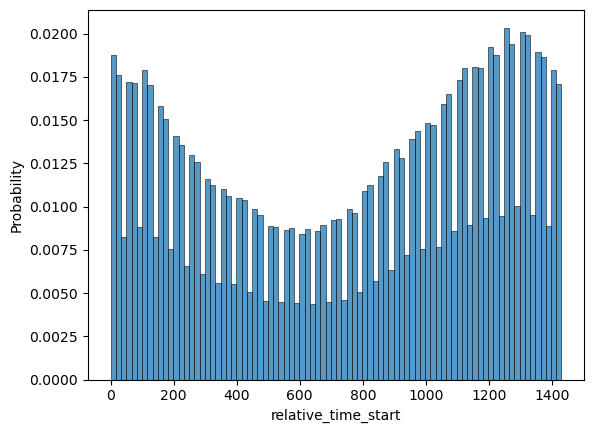

In [9]:
sns.histplot(twitch_little_data, x = 'relative_time_start', stat = 'probability')

## Distribution of watchtime by hour

[Text(0, 0.5, 'Probability of Watching'),
 Text(0.5, 0, 'Hour'),
 Text(0.5, 1.0, 'Distribution of Watching Twitch V.S. Hour')]

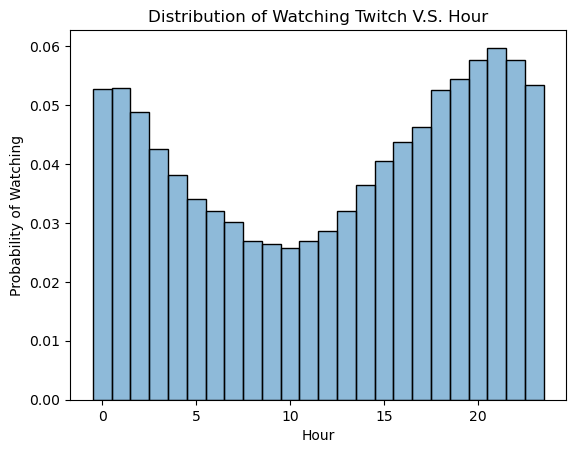

In [10]:
fig = sns.histplot(twitch_little_data, x = 'relative_hour_start', stat = 'probability', discrete = True, alpha=0.5); 
# fig = sns.histplot(twitch_little_data, x = 'relative_hour_stop', stat = 'probability', discrete = True, alpha=0.5, label="End Hour"); 
fig.set(ylabel='Probability of Watching', xlabel ='Hour', title='Distribution of Watching Twitch V.S. Hour')

[Text(0, 0.5, 'Probability of Watching'),
 Text(0.5, 0, 'Day'),
 Text(0.5, 1.0, 'Distribution of Watching Twitch V.S. Days')]

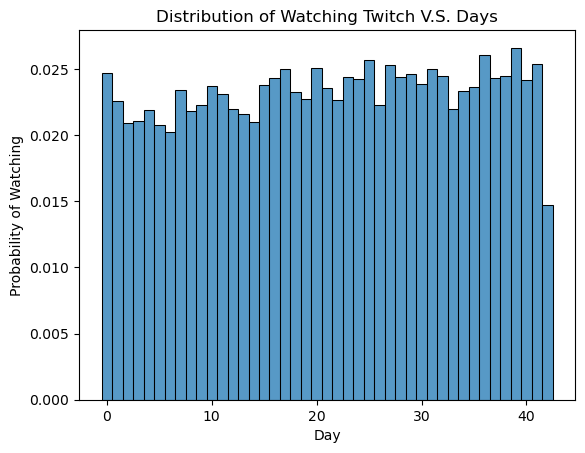

In [11]:
fig = sns.histplot(twitch_little_data, x = 'day_start', discrete=True, stat='probability')
fig.set(ylabel='Probability of Watching', xlabel ='Day', title='Distribution of Watching Twitch V.S. Days')

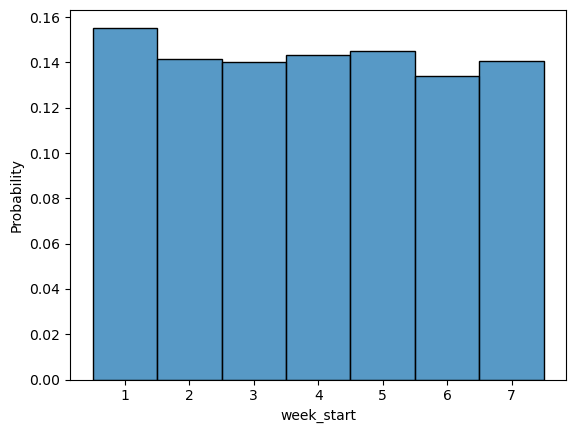

In [12]:
sns.histplot(twitch_little_data, x = 'week_start', stat = 'probability', discrete = True);


# Predictive

## Baseline

In [8]:
concurrent_viewers = defaultdict(lambda: defaultdict(int))
for index, row in twitch_little_data.iterrows():
    start_time, stop_time, streamer = row['time_start'], row['time_stop'], row['streamer_username']
    for time in range(start_time, stop_time+1, 10):
        concurrent_viewers[time][streamer] += 1
most_viewed_streamer = {time:max(dictionary, key=dictionary.get) for time, dictionary in  concurrent_viewers.items()}

KeyboardInterrupt: 

In [134]:
twitch_little_data.groupby('user_id').count().index

Int64Index([     1,      2,      3,      4,      5,      6,      7,      8,
                 9,     10,
            ...
             99991,  99992,  99993,  99994,  99995,  99996,  99997,  99998,
             99999, 100000],
           dtype='int64', name='user_id', length=100000)

In [133]:
#encoding user watch history
end_data_time = twitch_little_data.sort_values('time_start').iloc[-1]['time_stop']//10

In [120]:
from scipy.sparse import lil_matrix
watch_history = lil_matrix((end_data_time+1, len(twitch_little_data.groupby('user_id').count().index)), dtype = 'str')
print(watch_history.data)


#vectorizes watch history of each user, loses data in case where user is watching multiple streams
for user in twitch_little_data.groupby('user_id').count().index:
    for stream in twitch_little_data[twitch_little_data['user_id'] == user].to_numpy():
        start_i = stream[3] // 10
        end_i = stream[4] // 10
        for i in range(start_i,end_i+1):
            print(user, i, stream[2])
            watch_history.data[user, i] = stream[2]
watch_history

[list([]) list([]) list([]) ... list([]) list([]) list([])]
1 154 mithrain


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [157]:
import csv
#vectorizes watch history of each user, loses data in case where user is watching multiple streams
with open('watch_history_sparse.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)
    for user in twitch_little_data.groupby('user_id').count().index:
        row = np.empty(end_data_time+1, dtype='<U25')
        for stream in twitch_little_data[twitch_little_data['user_id'] == user].to_numpy():
            start_i = stream[3] // 10
            end_i = stream[4] // 10
            for i in range(start_i,end_i+1):
                row[i] = stream[2]
        writer.writerow(row)

In [155]:
from scipy.sparse import lil_matrix
#encoding user watch history
end_data_time = max(twitch_little_data['time_stop'])//10
unique_users = twitch_little_data['user_id'].nunique()
from scipy.sparse import lil_matrix
watch_history = lil_matrix((unique_users+1, end_data_time+1), dtype='str')


#vectorizes watch history of each user, loses data in case where user is watching multiple streams
for index, row in twitch_little_data.iterrows():
    start_time, stop_time, streamer, user = row['time_start'], row['time_stop'], row['streamer_username'], row['user_id']
    for time in range(start_time, stop_time+1):
        watch_history[user, time//10] = streamer
    if index % 1000 == 0:
        print(index)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000


1165000
1166000
1167000
1168000
1169000
1170000
1171000
1172000
1173000
1174000
1175000
1176000
1177000
1178000
1179000
1180000
1181000
1182000
1183000
1184000
1185000
1186000
1187000
1188000
1189000
1190000
1191000
1192000
1193000
1194000
1195000
1196000
1197000
1198000
1199000
1200000
1201000
1202000
1203000
1204000
1205000
1206000
1207000
1208000
1209000
1210000
1211000
1212000
1213000
1214000
1215000
1216000
1217000
1218000
1219000
1220000
1221000
1222000
1223000
1224000
1225000
1226000
1227000
1228000
1229000
1230000
1231000
1232000
1233000
1234000
1235000
1236000
1237000
1238000
1239000
1240000
1241000
1242000
1243000
1244000
1245000
1246000
1247000
1248000
1249000
1250000
1251000
1252000
1253000
1254000
1255000
1256000
1257000
1258000
1259000
1260000
1261000
1262000
1263000
1264000
1265000
1266000
1267000
1268000
1269000
1270000
1271000
1272000
1273000
1274000
1275000
1276000
1277000
1278000
1279000
1280000
1281000
1282000
1283000
1284000
1285000
1286000
1287000
1288000
1289000


2190000
2191000
2192000
2193000
2194000
2195000
2196000
2197000
2198000
2199000
2200000
2201000
2202000
2203000
2204000
2205000
2206000
2207000
2208000
2209000
2210000
2211000
2212000
2213000
2214000
2215000
2216000
2217000
2218000
2219000
2220000
2221000
2222000
2223000
2224000
2225000
2226000
2227000
2228000
2229000
2230000
2231000
2232000
2233000
2234000
2235000
2236000
2237000
2238000
2239000
2240000
2241000
2242000
2243000
2244000
2245000
2246000
2247000
2248000
2249000
2250000
2251000
2252000
2253000
2254000
2255000
2256000
2257000
2258000
2259000
2260000
2261000
2262000
2263000
2264000
2265000
2266000
2267000
2268000
2269000
2270000
2271000
2272000
2273000
2274000
2275000
2276000
2277000
2278000
2279000
2280000
2281000
2282000
2283000
2284000
2285000
2286000
2287000
2288000
2289000
2290000
2291000
2292000
2293000
2294000
2295000
2296000
2297000
2298000
2299000
2300000
2301000
2302000
2303000
2304000
2305000
2306000
2307000
2308000
2309000
2310000
2311000
2312000
2313000
2314000


In [75]:
watch_history[991] = np.empty(end_data_time, dtype='<U25')
for stream in twitch_little_data[twitch_little_data['user_id'] == 991].to_numpy():
    start_i = stream[3] // 10
    end_i = stream[4] // 10
    for i in range(start_i,end_i+1):
        watch_history[991][i] = stream[2]
        print(i, stream[2])

3 linhwayeon1104
4 linhwayeon1104
4 venustwitch_
5 venustwitch_
2 piachantv
3 piachantv
14 esl_csgo
15 esl_csgo
15 xchocobars
16 xchocobars
34 disguisedtoast
35 disguisedtoast
36 disguisedtoast
37 disguisedtoast
37 esl_csgo
38 esl_csgo
39 esl_csgo
132 venustwitch_
133 venustwitch_
132 destiny
133 destiny
315 hyoon
316 hyoon
647 amouranth
648 amouranth
652 ferzerkph
653 ferzerkph
746 venustwitch_
747 venustwitch_
787 marieantte
788 marieantte
788 xlykamea
789 xlykamea
787 niwenwen6
788 niwenwen6
789 niwenwen6
790 niwenwen6
842 noctile
843 noctile
844 noctile
984 seikachu
985 seikachu
986 seikachu
987 seikachu
1200 disguisedtoast
1201 disguisedtoast
1202 disguisedtoast
1223 niwenwen6
1224 niwenwen6
1225 niwenwen6
1386 esl_csgo
1387 esl_csgo
1388 esl_csgo
1389 esl_csgo
1390 esl_csgo
1391 esl_csgo
1392 esl_csgo
1382 sadparu
1383 sadparu
1384 sadparu
1499 wlswnwlswn
1500 wlswnwlswn
1501 wlswnwlswn
1502 wlswnwlswn
1539 venustwitch_
1540 venustwitch_
1638 hyoon
1639 hyoon
1772 esl_csgo
1773 e

In [144]:
watch_history[3]

<1x6149 sparse matrix of type '<class 'numpy.str_'>'
	with 48 stored elements in List of Lists format>

In [153]:
watch_history.getrow(991).toarray()

array([['', '', 'p', ..., '', '', '']], dtype='<U1')

In [150]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(lowercase = False)
X = vectorizer.fit_transform(watch_history)

TypeError: expected string or bytes-like object

In [8]:
dataTrain = twitch_little_data[twitch_little_data['time_stop'] < 50000].sort_values('time_start')
dataTest = twitch_little_data[twitch_little_data['time_stop'] >= 50000].sort_values('time_start')
dataTrain

,user_id,stream_id,streamer_username,time_start,time_stop,time_watched,relative_time_start,relative_time_stop,relative_hour_start,relative_hour_stop,day_start,day_stop,week_start,week_stop
247782,8359,33824437872,break,0,10,10,0,10,0,0,0,0,1,1
1227245,40442,33825299296,yassuo,0,30,30,0,30,0,0,0,0,1,1
2059791,67966,33825211072,handongsuk,0,20,20,0,20,0,0,0,0,1,1
2960476,97055,33827518864,lirik,0,40,40,0,40,0,0,0,0,1,1
644264,21343,33828189312,paynewitch,0,20,20,0,20,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1325873,43802,34305045888,wkgml,49980,49990,10,1020,1030,17,17,34,34,7,7
1667312,54988,34305574208,s1mple,49980,49990,10,1020,1030,17,17,34,34,7,7
1269490,41860,34306970720,kendinemuzisyen,49980,49990,10,1020,1030,17,17,34,34,7,7
2937692,96260,34306924640,electrokidi,49980,49990,10,1020,1030,17,17,34,34,7,7


In [9]:
time_sort = dataTrain.to_numpy()
time_sort

array([[8359, 33824437872, 'break', ..., 0, 1, 1],
       [40442, 33825299296, 'yassuo', ..., 0, 1, 1],
       [67966, 33825211072, 'handongsuk', ..., 0, 1, 1],
       ...,
       [41860, 34306970720, 'kendinemuzisyen', ..., 34, 7, 7],
       [96260, 34306924640, 'electrokidi', ..., 34, 7, 7],
       [40595, 34307874560, 'wpmezony', ..., 34, 7, 7]], dtype=object)

In [10]:
user_interactions = defaultdict(list)

In [11]:
for interaction in time_sort:
    user = interaction[0]
    streamer = interaction[2]
    time_watched = interaction[5]//10
    for _ in range(time_watched):
        user_interactions[user].append(streamer)
user_interactions

defaultdict(list,
            {8359: ['break',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'slayerage',
              'teawrex',
              'teawrex',
              'teawrex',
              'teawrex',
              'teawrex',
              'grimmmz',
              'grimmmz',
              'grimmmz',
              'grimmmz',
              'sodapoppin',
              'sodapoppin',
              'sodapoppin',
              'sodapoppin',
              'sodapop

In [24]:
tokens = list(dataTrain['streamer_username'].unique())

In [38]:
len(tokenizer.word_index), len(tokens)

(143728, 143728)

In [33]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts([tokens])
pickle.dump(tokenizer, open('tokenizer1.pkl', 'wb'))
sequence_data = tokenizer.texts_to_sequences([tokens])[0]
sequence_data[:10]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [34]:
for user, interactions in user_interactions.items():
    print(tokenizer.texts_to_sequences(interactions))


[[1], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [14572], [1711], [1711], [1711], [1711], [1711], [6808], [6808], [6808], [6808], [17136], [17136], [17136], [17136], [17136], [17136], [17136], [17136], [17136], [32], [1719], [1719], [1711], [1711], [547], [16855], [16855], [16855], [16855], [16855], [1108], [], [], [], [], [], [79150], [79150], [79150], [79150], [79150], [1711], [4], [4], [4], [6499], [1711], [1711], [11287], [11287], [11287], [11287], [120], [120], [120], [120], [120], [120], [16855], [16855], [16855], [1711], [120], [120], [120], [], [52504], [52504], [18318], [18318], [11287], [11287], [120], [2413], [2413], [2413], [2413], [118408], [16855], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [11287], [4], [4], [4], [4], [4], [4], [4], [14572], [1711], [1711], [14572], [14572], [14572], [6499], [1], [1], [1], [32], [9

[[15], [15], [15], [15], [15], [260], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [3542], [11285], [10102], [10102], [12209], [12209], [12323], [10170], [10170], [4531], [17136], [15], [], [], [], [3784], [3784], [14350], [2762], [2762], [2762], [2762], [260], [260], [110344], [110344], [110344], [110344], [110344], [16294], [16294], [13729], [13729], [13729], [13729], [13729], [13729], [13729], [13729], [13729], [13729], [12974], [260], [260], [260], [15], [17136], [17136], [17136], [17136], [17136], [17136], [17136], [17136], [24785], [24785], [2762], [2762], [20204], [20204], [20204], [15], [17136], [17136], [17136], [17136], [17136], [17136], [13124], [13124], [22258], [53107], [14286], [11285], [53107], [260], [260], [260], [4046], [4046], [4046], [4046], [4046], [4046], [4046], [4046], [4559], [15], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [1316], [13

[[112], [112], [], [], [4429], [4429], [4429], [24800], [2790], [2790], [2790], [2790], [], [231], [2790], [4460], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [123], [4430], [17947], [17947], [24438], [17947], [17947], [17947], [4431], [4431], [4431], [4431], [4431], [4431], [4431], [538], [538], [538], [231], [231], [11294], [161], [161], [161], [17775], [17775], [17775], [17775], [4431], [4431], [4431], [4431], [4431], [], [], [18769], [538], [538], [538], [46986], [46986], [46986], [46986], [46986], [15194], [15194], [15194], [112], [112], [112], [112], [112], [], [], [], [], [112], [112], [112], [112], [112], [11294], [11294], [11294], [11294], [11294], [11294], [11294], [11294], [11294], [11294], [11294], [4460], [4460], [112], [], [4431], [4431], [4431], [112], [112], [112], [112], [112], [112], [112], [24438], [17775], [17775], [4431], [4431], [4431], [11492], [], [56460], [14337], [15194], [15194]

[[206], [206], [206], [], [], [8775], [8775], [8775], [8775], [8775], [8775], [3509], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [11279], [206], [11279], [19236], [19236], [19236], [19236], [19236], [19236], [19236], [1132], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [120], [120], [120], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [7876], [3833], [7876], [7876], [2762], [2762], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [6808], [7876], [7876], [7876], [7876], [10651], [10651], [10651], [10651], [50256], [50256], [50256], [50256], [

[[22], [506], [506], [18819], [16855], [16855], [16855], [16855], [2288], [2288], [22], [23999], [17136], [22], [22], [2127], [23999], [3951], [22], [22], [22], [4789], [4789], [3951], [3951], [3951], [3951], [3951], [3951], [18819], [18819], [8661], [8661], [8661], [8661], [22], [22], [22], [22], [22], [22], [22], [22], [3711], [8185], [7238], [18819], [23999], [23999], [23999], [23999], [23999], [23999], [23999], [3951], [3951], [3951], [3951], [3951], [3951], [58769], [58769], [58769], [8185], [7589], [7589], [7589], [81139], [3846], [3846], [3846], [3846], [4], [341], [341], [2074], [2127], [5551], [6049], [6049], [6049], [6049], [6049], [6049], [17136], [2692], [2692], [2692], [2692], [2692], [2692], [2692], [2692], [2692], [17136], [17136], [17136], [17136], [49495], [25324], [25324], [25324], [2692], [2692], [4789], [38745], [38745], [38745], [38745], [22], [22], [25159], [25159], [25159], [22], [3846], [3846], [4], [4], [4], [16855], [22], [22], [22], [22], [22], [22], [16855],

[[269], [275], [275], [4985], [4985], [4985], [4985], [16122], [4989], [4989], [64], [9], [275], [275], [275], [275], [275], [5509], [269], [47526], [47526], [47526], [47526], [48214], [47444], [16122], [16122], [16122], [16122], [6263], [6263], [6263], [6263], [6263], [16419], [16419], [16419], [16419], [16419], [16419], [16419], [16419], [16419], [48214], [48214], [48214], [269], [269], [269], [269], [269], [269], [48214], [48214], [48214], [48214], [16419], [], [12416], [26953], [26953], [26953], [26953], [26953], [26953], [26953], [275], [275], [275], [275], [275], [275], [275], [275], [269], [269], [269], [269], [26953], [26953], [25871], [25871], [25871], [25871], [9729], [9729], [269], [269], [269], [269], [269], [269], [269], [269], [269], [269], [269], [13973], [13973], [13973], [233], [79309], [79309], [24322], [24322], [24322], [24322], [24322], [5509], [5509], [5509], [5509], [5509], [5509], [5509], [64], [13973], [13973], [13973], [13973], [13973], [13973], [13973], [13973

[[3], [3], [6176], [9197], [9197], [9197], [9197], [20280], [20280], [20280], [20280], [20280], [10231], [10231], [5871], [5871], [6765], [6765], [5667], [5667], [5667], [5667], [5667], [5667], [5667], [5667], [5667], [5667], [22656], [22656], [22656], [22656], [22656], [22656], [22656], [22656], [22656], [1264], [1264], [1264], [1264], [], [], [20280], [20280], [20280], [20280], [20280], [20280], [10231], [10231], [10231], [10231], [10231], [10231], [10231], [10231], [5871], [5871], [5871], [30545], [10645], [10645], [10645], [10645], [1264], [1264], [1264], [1264], [1264], [1264], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [1264], [6765], [21981], [9197], [9197], [9197], [9197], [6765], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [], [13091], [13091], [20226], [20226], [20226], [20226], [6765], [6765], [6765], [6765], [72342], [72342], [72342], [72342], [72342], [72342], [72342], [7

[[2], [2], [2], [1165], [1165], [37244], [37244], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [38745], [15383], [38745], [38745], [38745], [38745], [2136], [38745], [38745], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [37244], [24244], [24244], [24244], [24244], [24244], [24244], [24244], [24244], [24244], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [3523], [37244], [37244], [37244], 

[[18], [18], [1144], [2767], [15775], [15775], [15775], [15775], [369], [369], [369], [369], [369], [369], [], [], [], [], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [15200], [18], [18], [18], [18], [18], [18], [18], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [12269], [12268], [12268], [12268], [12268], [12268], [12268], [], [16290], [16290], [16290], [16290], [16290], [16290], [1382], [1217], [24402], [24402], [24402], [24402], [24402], [24402], [24402], [52426], [52426], [52426], [52426], [55977], [55977], [55977], [16290], [16290], [16290], [16290], [16290], [16290], [52426], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [16290], [18], [55977], [55977], [55977], [55977],

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 

In [39]:
vocab_size = len(tokenizer.word_index) + 1
print(vocab_size)
sequences = []

for i in range(1, len(sequence_data)):
    words = sequence_data[i-1:i+1]
    sequences.append(words)
    
print("The Length of sequences are: ", len(sequences))
sequences = np.array(sequences)
sequences[:10]

143729
The Length of sequences are:  143727


array([[ 1,  2],
       [ 2,  3],
       [ 3,  4],
       [ 4,  5],
       [ 5,  6],
       [ 6,  7],
       [ 7,  8],
       [ 8,  9],
       [ 9, 10],
       [10, 11]])

In [58]:
corpus = []
for user, interactions in user_interactions.items():
    corpus.append([item for sublist in tokenizer.texts_to_sequences(list(interactions)) for item in sublist])

In [76]:
Xtrain = []
ytrain = []
for user in corpus:
    for i in range(10,len(user)):
        Xtrain.append(user[i-10:i])
        ytrain.append(user[i])

In [70]:
from sklearn.preprocessing import LabelBinarizer
lb = LabelBinarizer(sparse_output=True)
label_fitter = lb.fit(ytrain)
ytrain = label_fitter.transform(ytrain)

In [ ]:
from sklearn import svm
clf = svm.SVC()
clf.fit(Xtrain, ytrain)